In [1]:
!nvidia-smi

Sat Aug 31 15:03:51 2024       
+---------------------------------------------------------------------------------------+
| NVIDIA-SMI 535.104.05             Driver Version: 535.104.05   CUDA Version: 12.2     |
|-----------------------------------------+----------------------+----------------------+
| GPU  Name                 Persistence-M | Bus-Id        Disp.A | Volatile Uncorr. ECC |
| Fan  Temp   Perf          Pwr:Usage/Cap |         Memory-Usage | GPU-Util  Compute M. |
|                                         |                      |               MIG M. |
|=========================================+======================+======================|
|   0  NVIDIA A100-SXM4-40GB          Off | 00000000:00:04.0 Off |                    0 |
| N/A   32C    P0              44W / 400W |      2MiB / 40960MiB |      0%      Default |
|                                         |                      |             Disabled |
+-----------------------------------------+----------------------+--

In [2]:
!pip install -Uqqq pip --progress-bar off
!pip install -qqq git+https://github.com/huggingface/diffusers.git@d8a16635f47ac455abd61879bcc6be32dfeaa561
!pip install -qqq peft==0.12.0 --progress-bar off

  Installing build dependencies ... done
  Getting requirements to build wheel ... done
  Preparing metadata (pyproject.toml) ... done


In [1]:
import matplotlib
import matplotlib.pyplot as plt
import torch
from diffusers import FluxPipeline

SEED = 42
GENERATOR = torch.Generator("cpu").manual_seed(SEED)

In [2]:
pipe = FluxPipeline.from_pretrained(
    "black-forest-labs/FLUX.1-dev", torch_dtype=torch.bfloat16
)
pipe.to("cuda")

Loading pipeline components...:   0%|          | 0/7 [00:00<?, ?it/s]

You set `add_prefix_space`. The tokenizer needs to be converted from the slow tokenizers


Loading checkpoint shards:   0%|          | 0/2 [00:00<?, ?it/s]

FluxPipeline {
  "_class_name": "FluxPipeline",
  "_diffusers_version": "0.31.0.dev0",
  "_name_or_path": "black-forest-labs/FLUX.1-dev",
  "scheduler": [
    "diffusers",
    "FlowMatchEulerDiscreteScheduler"
  ],
  "text_encoder": [
    "transformers",
    "CLIPTextModel"
  ],
  "text_encoder_2": [
    "transformers",
    "T5EncoderModel"
  ],
  "tokenizer": [
    "transformers",
    "CLIPTokenizer"
  ],
  "tokenizer_2": [
    "transformers",
    "T5TokenizerFast"
  ],
  "transformer": [
    "diffusers",
    "FluxTransformer2DModel"
  ],
  "vae": [
    "diffusers",
    "AutoencoderKL"
  ]
}

In [5]:
prompt = """Create a highly detailed and realistic portrait of a beautiful woman with a warm, inviting smile.
Her expression should convey a subtle, yet captivating sense of allure, with her gaze directed straight at the camera.
Her eyes should sparkle with a mix of charm and confidence, drawing the viewer in.
The background should be blurred, ensuring full focus remains on her expressive face.
"""

In [6]:
%%time

image = pipe(
    prompt=prompt,
    height=1360,
    width=768,
    guidance_scale=3.5,
    output_type="pil",
    num_inference_steps=30,
    max_sequence_length=512,
    generator=torch.Generator("cpu").manual_seed(SEED),
).images[0]

  0%|          | 0/30 [00:00<?, ?it/s]

CPU times: user 12.3 s, sys: 4.01 s, total: 16.4 s
Wall time: 16.9 s


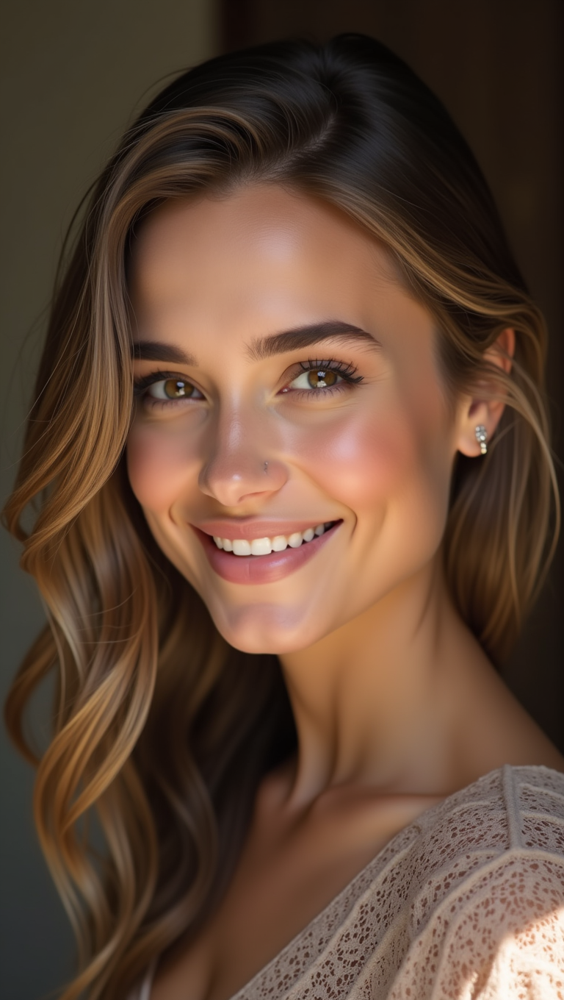

In [7]:
image

## Generation Settings

In [8]:
%%time
steps = [5, 10, 15, 20, 25, 30]

images = []
for n_steps in steps:
    images.append(
        pipe(
            prompt=prompt,
            height=1360,
            width=768,
            guidance_scale=3.5,
            output_type="pil",
            num_inference_steps=n_steps,
            max_sequence_length=512,
            generator=torch.Generator("cpu").manual_seed(SEED),
        ).images[0]
    )

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/10 [00:00<?, ?it/s]

  0%|          | 0/15 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/25 [00:00<?, ?it/s]

  0%|          | 0/30 [00:00<?, ?it/s]

CPU times: user 40.5 s, sys: 13.8 s, total: 54.3 s
Wall time: 53.9 s


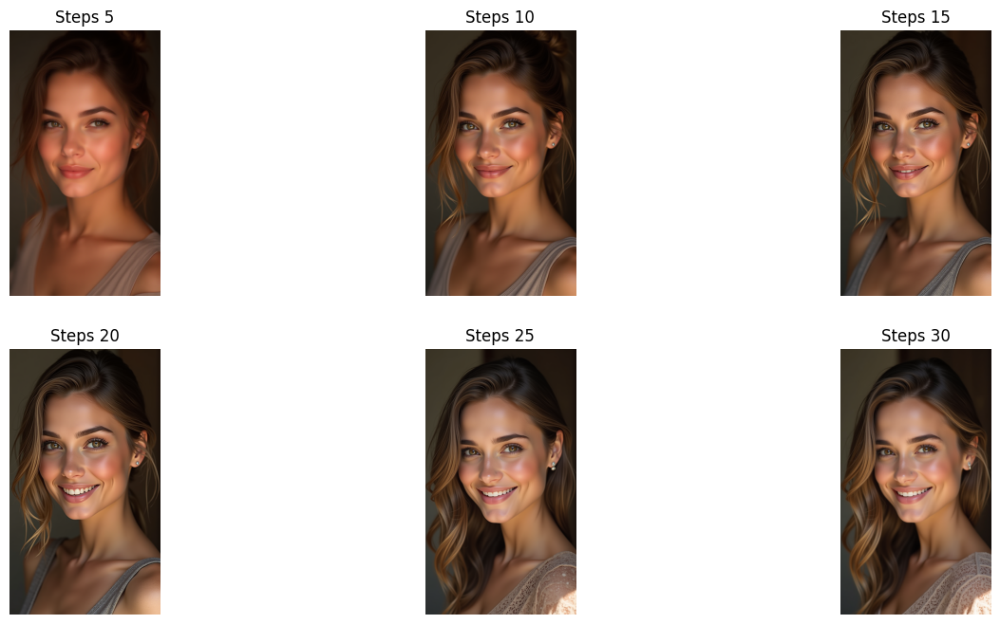

In [9]:
fig, axes = plt.subplots(nrows=2, ncols=3, figsize=(16, 8))

for ax, img, n_steps in zip(axes.flatten(), images, steps):
    ax.imshow(img)
    ax.axis("off")
    ax.set_title(f"Steps {n_steps}")

In [10]:
guidances = [0, 2, 4, 6, 8, 10]

In [11]:
%%time

images = []
for guidance in guidances:
    images.append(
        pipe(
            prompt=prompt,
            height=1360,
            width=768,
            guidance_scale=guidance,
            output_type="pil",
            num_inference_steps=30,
            max_sequence_length=512,
            generator=GENERATOR,
        ).images[0]
    )

  0%|          | 0/30 [00:00<?, ?it/s]

  0%|          | 0/30 [00:00<?, ?it/s]

  0%|          | 0/30 [00:00<?, ?it/s]

  0%|          | 0/30 [00:00<?, ?it/s]

  0%|          | 0/30 [00:00<?, ?it/s]

  0%|          | 0/30 [00:00<?, ?it/s]

CPU times: user 1min 8s, sys: 23.6 s, total: 1min 32s
Wall time: 1min 31s


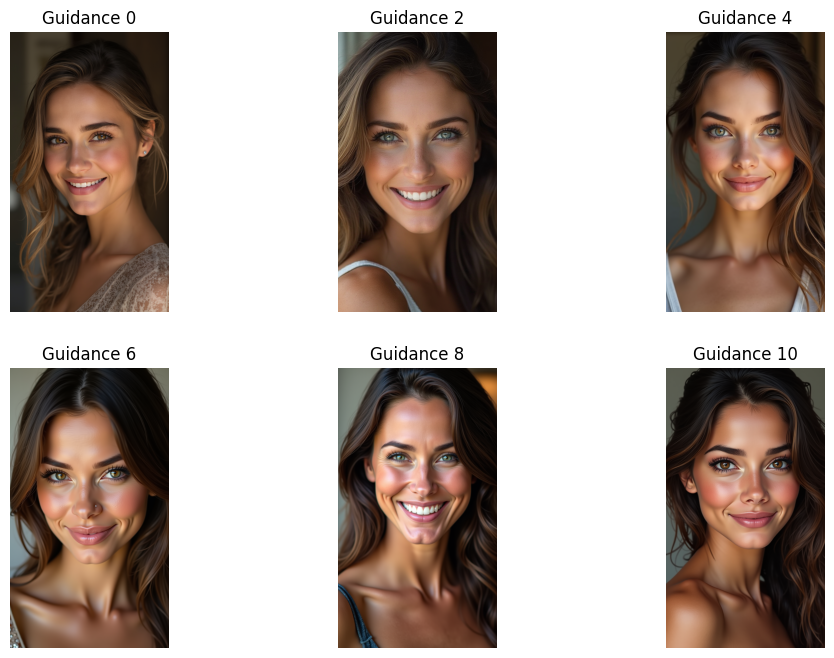

In [12]:
fig, axes = plt.subplots(nrows=2, ncols=3, figsize=(12, 8))

for ax, img, guidance in zip(axes.flatten(), images, guidances):
    ax.imshow(img)
    ax.axis("off")
    ax.set_title(f"Guidance {guidance}")

## Examples

In [46]:
prompt = """
A mythical, cute, cartoonish hydra with a single, large head, covered in soft purple scales.
The hydra has big, expressive eyes and a wide, friendly smile, exuding a cuddly and approachable demeanor.
The body is chubby and playful, with short, rounded limbs and a small, wagging tail.
The background features a whimsical, enchanted forest.
"""

In [49]:
%%time
images = pipe(
    prompt=prompt,
    height=768,
    width=1024,
    guidance_scale=3.5,
    output_type="pil",
    num_inference_steps=30,
    max_sequence_length=512,
    generator=torch.Generator("cpu").manual_seed(SEED),
).images

The following part of your input was truncated because CLIP can only handle sequences up to 77 tokens: ['soft, glowing light.']


  0%|          | 0/30 [00:00<?, ?it/s]

CPU times: user 9.63 s, sys: 2.58 s, total: 12.2 s
Wall time: 12.1 s


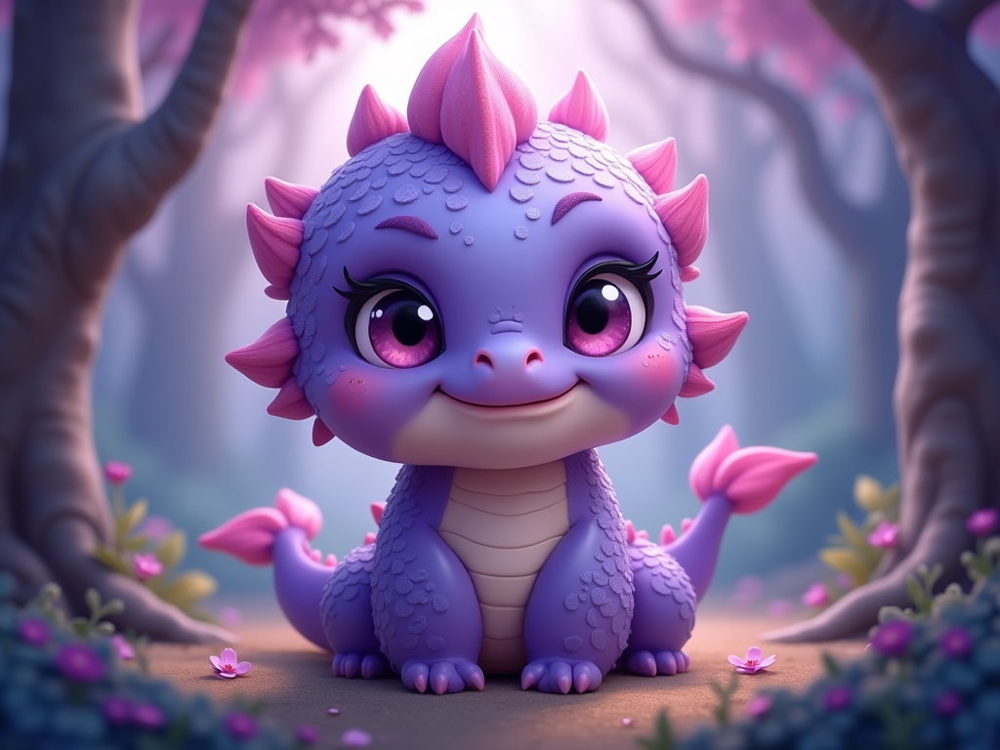

In [37]:
images[0]

## Multiple Images

In [5]:
prompt = """
Two adorable penguins holding hands on a sunny beach.
One penguin has a small bowtie, while the other wears a colorful sun hat.
They stand on soft golden sand with gentle ocean waves lapping in the background.
The sky is bright and clear, with a few fluffy clouds, and a seashell lies nearby, adding to the playful, heartwarming scene.
"""

In [6]:
%%time
images = pipe(
    prompt=prompt,
    height=768,
    width=1024,
    guidance_scale=3.5,
    output_type="pil",
    num_inference_steps=30,
    max_sequence_length=512,
    num_images_per_prompt=4,
    generator=torch.Generator("cpu").manual_seed(SEED),
).images

  0%|          | 0/30 [00:00<?, ?it/s]

CPU times: user 30.6 s, sys: 15.2 s, total: 45.8 s
Wall time: 45.8 s


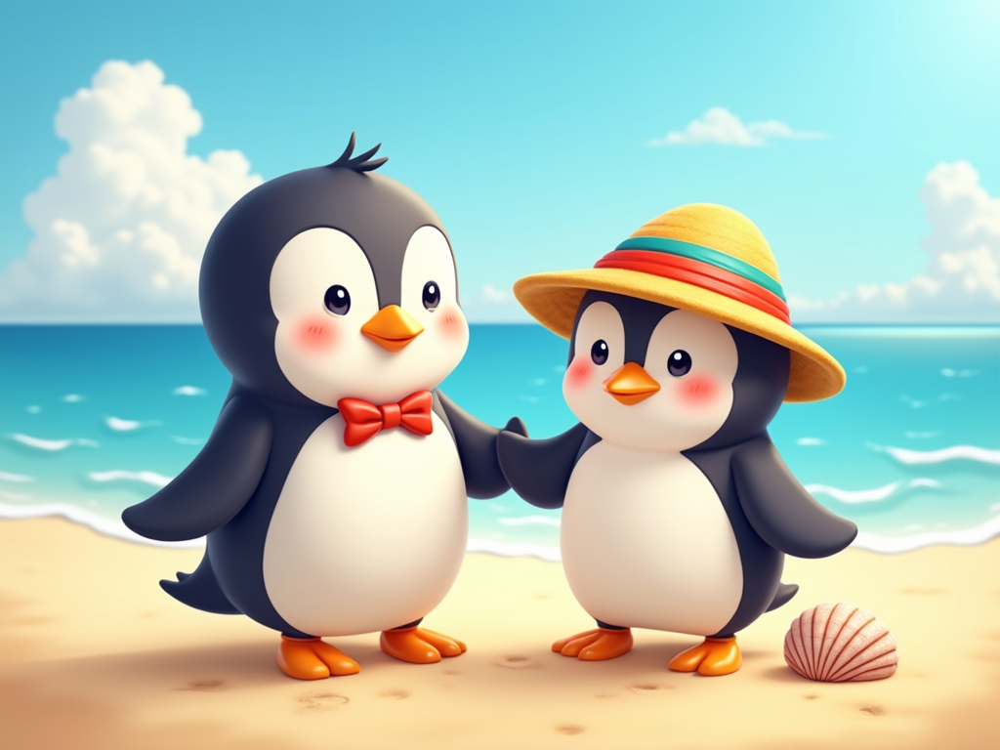

In [7]:
images[0]

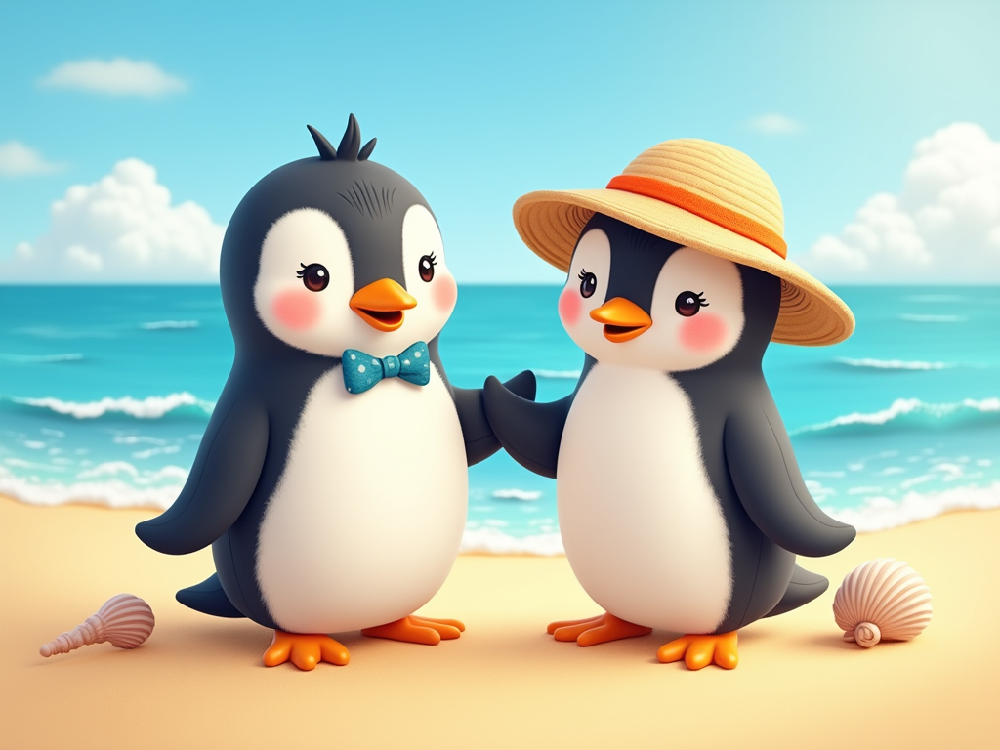

In [8]:
images[1]

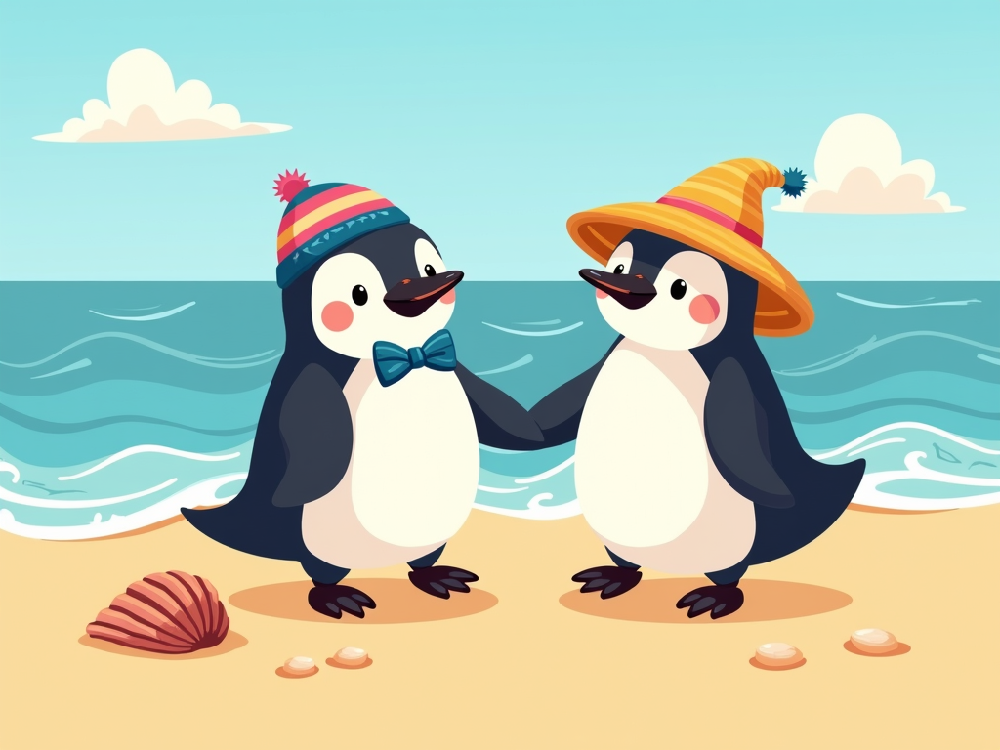

In [9]:
images[2]

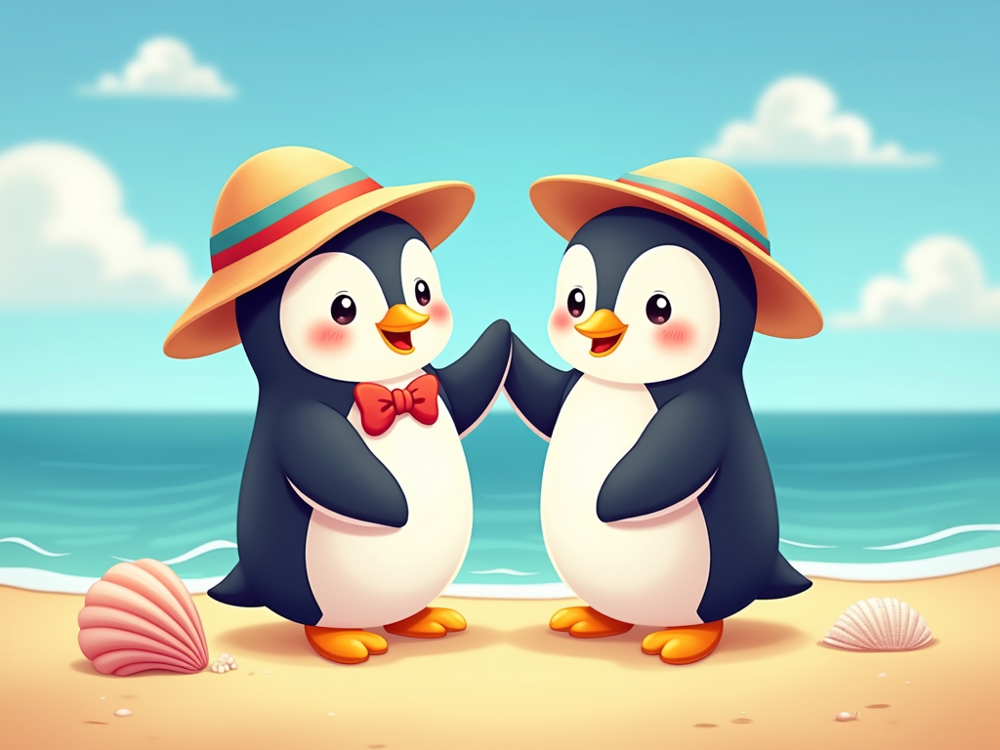

In [10]:
images[3]

## Photorealism (LoRA adapter)

In [11]:
pipe.load_lora_weights(
    pretrained_model_name_or_path_or_dict="XLabs-AI/flux-RealismLora",
    weight_name="lora.safetensors",
)

In [20]:
prompt = """Create a highly detailed and realistic portrait of a beautiful woman with a warm, inviting smile.
Her expression should convey a subtle, yet captivating sense of allure, with her gaze directed straight at the camera.
Her eyes should sparkle with a mix of charm and confidence, drawing the viewer in.
The background should be blurred, ensuring full focus remains on her expressive face.
"""

In [20]:
%%time
images = pipe(
    prompt=prompt,
    height=768,
    width=1024,
    guidance_scale=3.5,
    output_type="pil",
    num_inference_steps=30,
    max_sequence_length=512,
    generator=torch.Generator("cpu").manual_seed(SEED),
    joint_attention_kwargs={"scale": 1.0},
).images

  0%|          | 0/30 [00:00<?, ?it/s]

CPU times: user 9.96 s, sys: 2.58 s, total: 12.5 s
Wall time: 12.5 s


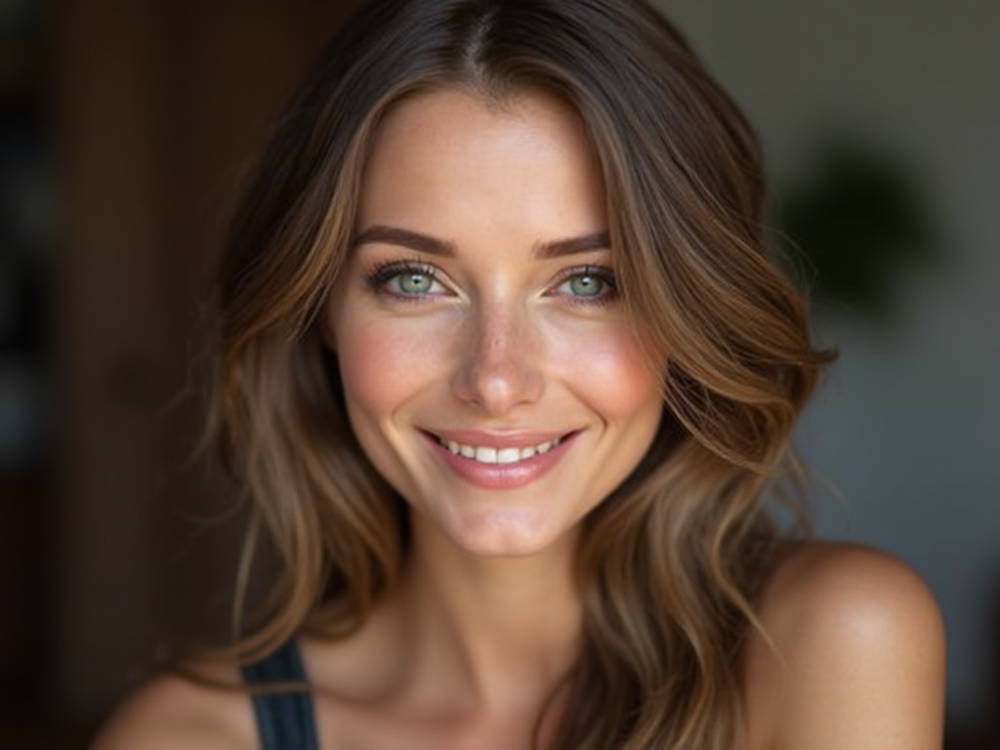

In [21]:
images[0]

In [28]:
prompt = """
A baby blue and turquoise excavator parked at a bustling Slavic street repair site.
The excavator has a friendly, compact design with oversized, rounded features.
The surrounding scene includes cobblestone streets, traditional Slavic architecture with colorful facades,
and construction tools scattered around. The background shows a vibrant urban setting with people and
vintage buildings, adding a lively, authentic touch
"""

In [29]:
scales = [0.0, 0.25, 0.5, 1.0]

In [30]:
%%time
images = []

for scale in scales:
    images.append(
        pipe(
            prompt=prompt,
            height=768,
            width=1024,
            guidance_scale=3.5,
            output_type="pil",
            num_inference_steps=30,
            max_sequence_length=512,
            generator=torch.Generator("cpu").manual_seed(SEED),
            joint_attention_kwargs={"scale": scale},
        ).images[0]
    )

  0%|          | 0/30 [00:00<?, ?it/s]

  0%|          | 0/30 [00:00<?, ?it/s]

  0%|          | 0/30 [00:00<?, ?it/s]

  0%|          | 0/30 [00:00<?, ?it/s]

CPU times: user 40.2 s, sys: 9.88 s, total: 50 s
Wall time: 49.7 s


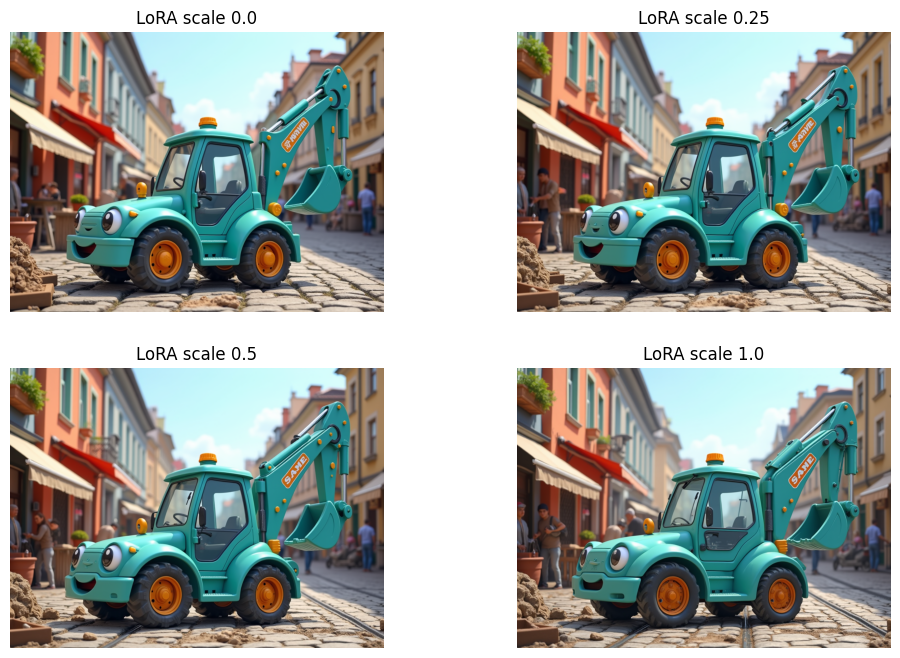

In [31]:
fig, axes = plt.subplots(nrows=2, ncols=2, figsize=(12, 8))

for ax, img, scale in zip(axes.flatten(), images, scales):
    ax.imshow(img)
    ax.axis("off")
    ax.set_title(f"LoRA scale {scale}")

In [34]:
prompt = """A stunning modern oceanfront house with sleek architecture and expansive glass windows,
offering a breathtaking view of the sparkling water. The house features clean lines, an open layout, and a spacious deck.
Surrounding it is lush, vibrant greenery with flourishing flora under a bright, sunny sky.
The scene captures a warm, inviting atmosphere with the shimmering ocean in the background.
"""

In [35]:
%%time
images = pipe(
    prompt=prompt,
    height=768,
    width=1024,
    guidance_scale=3.5,
    output_type="pil",
    num_inference_steps=30,
    max_sequence_length=512,
    num_images_per_prompt=4,
    generator=torch.Generator("cpu").manual_seed(SEED),
    joint_attention_kwargs={"scale": 1.0},
).images

  0%|          | 0/30 [00:00<?, ?it/s]

CPU times: user 30.8 s, sys: 15.2 s, total: 46 s
Wall time: 45.8 s


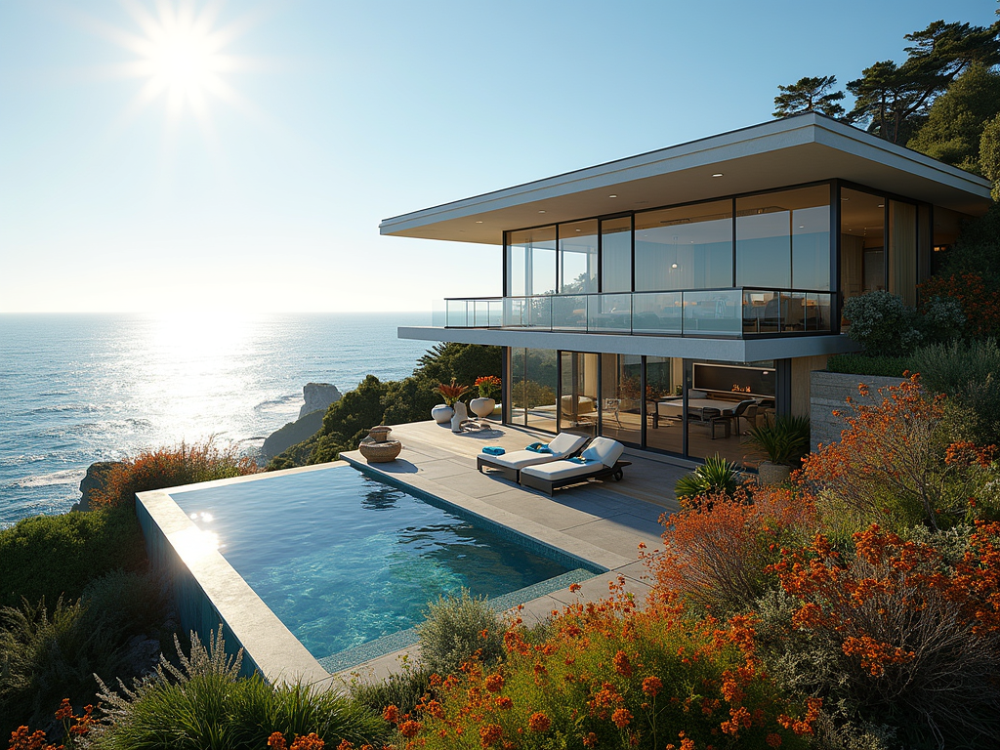

In [40]:
images[3]

In [41]:
prompt = """A modern Scandinavian-inspired bedroom with a minimalistic design featuring white furniture.
The room is bathed in natural sunlight streaming through two large windows, creating a bright, airy atmosphere.
Incorporate subtle blue accents in decorative pillows, a rug, or a piece of wall art to add pops of color.
The space is uncluttered, with sleek lines and an emphasis on functionality.
"""

In [42]:
%%time
images = pipe(
    prompt=prompt,
    height=768,
    width=1024,
    guidance_scale=3.5,
    output_type="pil",
    num_inference_steps=30,
    max_sequence_length=512,
    num_images_per_prompt=4,
    generator=torch.Generator("cpu").manual_seed(SEED),
    joint_attention_kwargs={"scale": 1.0},
).images

  0%|          | 0/30 [00:00<?, ?it/s]

CPU times: user 30.6 s, sys: 15.3 s, total: 45.8 s
Wall time: 45.6 s


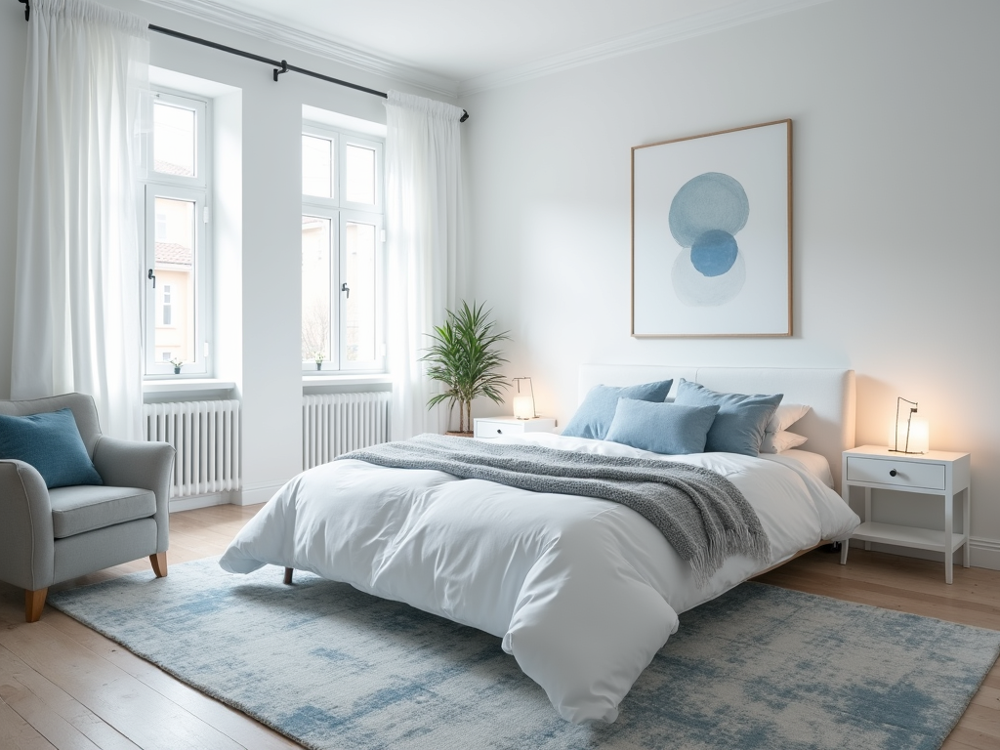

In [46]:
images[3]

In [3]:
prompt = """A charming baby unicorn avatar for a habit tracker app.
The unicorn is small, with a soft pastel color palette featuring light pink and lavender.
It has a sparkling, multicolored mane and a golden horn, with big, expressive eyes and a friendly smile.
The unicorn’s pose is playful and engaging, perfect for motivating users and adding a touch of magic to their daily tracking.
"""

In [12]:
%%time
images = pipe(
    prompt=prompt,
    height=768,
    width=1024,
    guidance_scale=2,
    output_type="pil",
    num_inference_steps=30,
    max_sequence_length=512,
    num_images_per_prompt=4,
    generator=torch.Generator("cpu").manual_seed(SEED),
    joint_attention_kwargs={"scale": 1.0},
).images

The following part of your input was truncated because CLIP can only handle sequences up to 77 tokens: ['daily tracking.']


  0%|          | 0/30 [00:00<?, ?it/s]

CPU times: user 30.1 s, sys: 14.7 s, total: 44.8 s
Wall time: 44.6 s


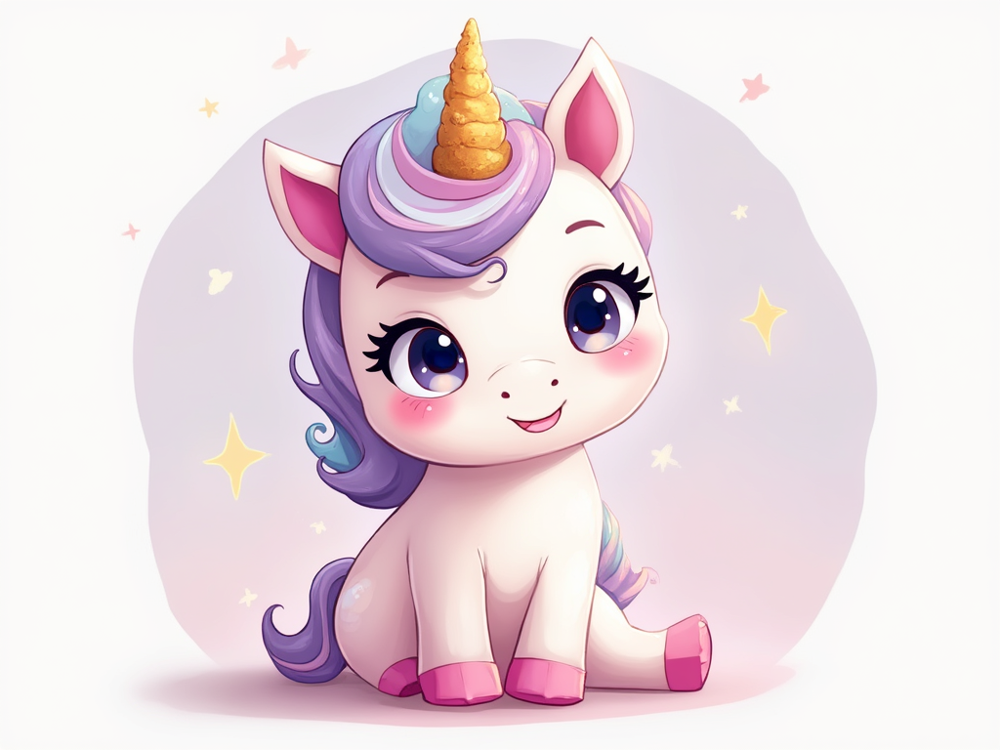

In [16]:
images[2]